In [7]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [8]:
# Import all useful lib

import os
import copy
import skillsnetwork
import pandas as pd
import random
from PIL import Image

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

import numpy as np
from numpy.core.fromnumeric import reshape

import cv2
import tensorflow as tf

import string
import unicodedata
import editdistance

import tensorflow.keras.backend as K

import keras
from keras import layers,Input,Sequential
from keras.layers import Dense,Flatten,Reshape,Conv2DTranspose,Conv2D, GlobalMaxPooling1D
from keras.models import Model
from keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.layers import Dense, LSTM, Reshape, BatchNormalization, Input, Conv2D, MaxPool2D, Lambda, Bidirectional, Add, Activation, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.activations import relu, sigmoid, softmax

from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import CSVLogger, TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.sequence import pad_sequences

import tensorboard


In [9]:
device_name = tf.test.gpu_device_name()
device_name

2023-10-19 19:36:09.567217: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-10-19 19:36:09.567233: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


'/device:GPU:0'

In [10]:
test_path = "OCR/public_test/images"

test_files = []
folders = os.listdir(test_path)
for folder in folders:
    files_list = os.listdir(test_path + "/" + folder)
    for i in range(len(files_list)):
        files_list[i] = test_path + "/" + folder + "/" + files_list[i]
        test_files.append(files_list[i])

len(test_files), test_files

(540,
 ['OCR/public_test/images/168/8.jpg',
  'OCR/public_test/images/168/9.jpg',
  'OCR/public_test/images/168/14.jpg',
  'OCR/public_test/images/168/15.jpg',
  'OCR/public_test/images/168/17.jpg',
  'OCR/public_test/images/168/16.jpg',
  'OCR/public_test/images/168/12.jpg',
  'OCR/public_test/images/168/13.jpg',
  'OCR/public_test/images/168/11.jpg',
  'OCR/public_test/images/168/10.jpg',
  'OCR/public_test/images/168/21.jpg',
  'OCR/public_test/images/168/20.jpg',
  'OCR/public_test/images/168/22.jpg',
  'OCR/public_test/images/168/23.jpg',
  'OCR/public_test/images/168/26.jpg',
  'OCR/public_test/images/168/18.jpg',
  'OCR/public_test/images/168/24.jpg',
  'OCR/public_test/images/168/25.jpg',
  'OCR/public_test/images/168/19.jpg',
  'OCR/public_test/images/168/4.jpg',
  'OCR/public_test/images/168/5.jpg',
  'OCR/public_test/images/168/7.jpg',
  'OCR/public_test/images/168/6.jpg',
  'OCR/public_test/images/168/2.jpg',
  'OCR/public_test/images/168/3.jpg',
  'OCR/public_test/images/1

In [11]:
# Load train data

anotation_path = "OCR/training_data/annotations"

arr = os.listdir(anotation_path)
dfs = []

for i in range(len(arr)):
    arr[i] = anotation_path + "/" + arr[i]
    dfi = pd.read_csv(arr[i], sep="\t", header=None)
    dfs.append(dfi)

df = pd.concat(dfs)

df = df.rename(columns={0: 'filepath', 1: 'text'})
df['filepath'] = "OCR/training_data/images/" + df['filepath']
df.head()

,filepath,text
0,OCR/training_data/images/289/0.jpg,615 Nguyễn Duy Phường 31 Quận 1 Tp Hồ Chí Minh
1,OCR/training_data/images/289/1.jpg,Thạnh Lợi Trung Thạnh Cờ Đỏ Cần Thơ
2,OCR/training_data/images/289/2.jpg,Ấp An Lạc An Thái Đông Cái Bè Tiền Giang
3,OCR/training_data/images/289/3.jpg,Thôn Thích Chung Thị Trấn Bá Hiến Bình Xuyên V...
4,OCR/training_data/images/289/4.jpg,Xuân Thọ Xuân Lộc Đồng Nai


In [12]:

#find all characters in labels (so we don't blindly add chacters not even existed in our dataset)
char_list= set()
for label in df["text"].values:
    char_list.update(set(label))
char_list=sorted(char_list)
len(char_list)

141

Thereis 141 characters in the addresses

In [13]:
# show all possible labels characters
"".join(char_list)

" '/123456789ABCDEFGHIJKLMNOPQRSTUVWXYabcdefghiklmnopqrstuvxyzÁÂÍÓÔÝàáâãèéêìíòóôõùúýăĐđĩũơƯưạẢảẤấầẩẫậắằẳẵặẹẻẽếềểễệỉịọỏốồỔổỗộớờỞởỡợụủỨứừửữựỳỵỷỹ"

In [14]:

# convert the words to array of indexs based on the char_list
def encode_to_labels(txt):
    # encoding each output word into digits of indexes
    dig_lst = []
    for index, char in enumerate(txt):
        try:
            dig_lst.append(char_list.index(char))
        except:
            print("No found in char_list :", char)

    return dig_lst

In [15]:

# find all image paths for train folder 1 and 2 and test folder
all_image_paths = df['filepath'].values
all_image_paths

array(['OCR/training_data/images/289/0.jpg',
       'OCR/training_data/images/289/1.jpg',
       'OCR/training_data/images/289/2.jpg', ...,
       'OCR/training_data/images/18/24.jpg',
       'OCR/training_data/images/18/25.jpg',
       'OCR/training_data/images/18/26.jpg'], dtype=object)

In [16]:
# YOUR CODE: Continue to preprocess dataset and create CRNN model with CTC loss!

#Matching full absoluate paths and labels instead of filenames and labels
dict_filepath_label= df.set_index('filepath')['text'].to_dict()
dict_filepath_label

{'OCR/training_data/images/289/0.jpg': '615 Nguyễn Duy Phường 31 Quận 1 Tp Hồ Chí Minh',
 'OCR/training_data/images/289/1.jpg': 'Thạnh Lợi Trung Thạnh Cờ Đỏ Cần Thơ',
 'OCR/training_data/images/289/2.jpg': 'Ấp An Lạc An Thái Đông Cái Bè Tiền Giang',
 'OCR/training_data/images/289/3.jpg': 'Thôn Thích Chung Thị Trấn Bá Hiến Bình Xuyên Vĩnh Phúc',
 'OCR/training_data/images/289/4.jpg': 'Xuân Thọ Xuân Lộc Đồng Nai',
 'OCR/training_data/images/289/5.jpg': 'Châu Can Phú Xuyên Hà Nội',
 'OCR/training_data/images/289/6.jpg': '751/33 Đặng Nguyên Cẩn Phường 25 Quận 1 Tp Hcm',
 'OCR/training_data/images/289/7.jpg': 'Thành Long Châu Thắng Vĩnh',
 'OCR/training_data/images/289/8.jpg': 'Đông Lễ Thành Phố Đông Hà Quảng Trị',
 'OCR/training_data/images/289/9.jpg': '84/11 Hoàng Hoa Thám Phường 68 Tân Bình Tp Hồ Chí Minh',
 'OCR/training_data/images/289/10.jpg': 'Tt Thọ Xuân Thọ Xuân Thanh Hoá',
 'OCR/training_data/images/289/11.jpg': '713/2a Lê Văn Thọ Phường 6 Gò Vấp Tp Hồ Chí Minh',
 'OCR/training_da

In [17]:

# find the maximum label length
max_label_len = df["text"].apply(len).max()

max_label_len, type(max_label_len)

(68, numpy.int64)

In [18]:
# all_image_paths = train_image_path

In [19]:
# find all widths and heights of images (this is useful if our dataset images got different sizes)
widths = []
heights = []
upwidths = []
upheight= []
for image_path in all_image_paths:
    img = cv2.imread(image_path)
    (height, width, _) = img.shape
    heights.append(height)
    widths.append(width)
    upwidth = int(163/height*width)
    upwidths.append(upwidth)
min_height = min(heights)
max_height = max(heights)
min_width = min(widths)
max_width = max(widths)
max_upwidth = max(upwidths)

In [20]:
(min_height, max_height, min_width, max_width, max_upwidth)

(58, 163, 851, 2634, 3002)

min_height: 58
max_height:163
min_width: 851
max_width: 2634

In [21]:
def preprocessimage(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


    new_height = 163
    new_width = int((163/img.shape[0])*img.shape[1])
    img = cv2.resize(img, (new_width, new_height))
    if (img.shape[1]<max_upwidth):
        # pad right image
        img = np.pad(img, ((0,0),(0, max_upwidth-new_width)), 'median')
    else:
        # crop right image
        print(img.shape)
        img = img[0:new_height, 0:max_upwidth]
        print(img.shape)
    # Blur image:
    img = cv2.GaussianBlur(img, (5,5), 0)

    # Threshold the image using adapative threshold
    img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 4)
    return img

In [22]:
# being a good Data Scientist, we need to have train set and test set
from sklearn.model_selection import train_test_split
test_size = 0.2
train_image_paths, val_image_paths = train_test_split(all_image_paths, test_size=test_size, random_state=42)

In [23]:
# Constants , copied, dont know why
TIME_STEPS = 333

In [24]:
# BUILD THE PIPELINE FOR THE IMAGES, definitely this is super basic pipeline and can be improved

import numpy as np

# lists for training dataset
training_img = []
training_txt = []
train_input_length = []
train_label_length = []
orig_txt = []
resize_max_width=2634
i=0
for train_img_path in train_image_paths:
    # print(f_name)
    # read input image and convert into gray scale image
    img = cv2.imread(train_img_path)
    img = preprocessimage(img)

    # add channel dimension
    img = np.expand_dims(img , axis = 2)

    # Normalize each image
    img = img/255.

    label = dict_filepath_label[train_img_path]

    # split data into validation and training dataset as 10% and 90% respectively
    orig_txt.append(label)
    train_label_length.append(len(label))

    # our time steps for valid input
    train_input_length.append(TIME_STEPS)
    training_img.append(img)

    # convert words to digits based on charlist
    training_txt.append(encode_to_labels(label))
    i+=1
    if (i%500 == 0):
        print ("has processed trained {} files".format(i))

(163, 3002)
(163, 3002)
has processed trained 500 files
has processed trained 1000 files
has processed trained 1500 files
has processed trained 2000 files


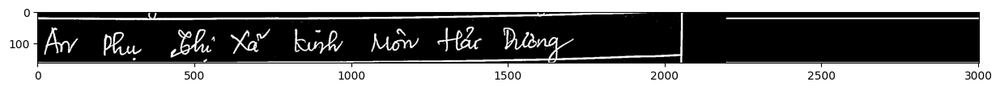

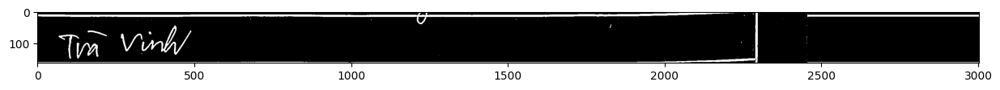

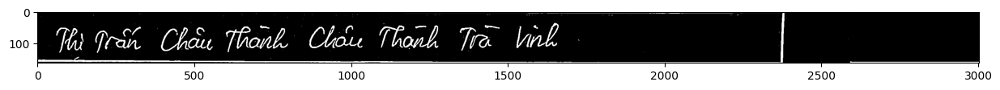

In [25]:
for i in range(3):
    plt.figure(figsize=(15,2))
    plt.imshow(training_img[i][:,:,0], cmap="gray")
    plt.show()

In [26]:
#lists for validation dataset
valid_img = []
valid_txt = []
valid_input_length = []
valid_label_length = []
valid_orig_txt = []

i=0

for val_img_path in val_image_paths:
    # print(f_name)
    # read input image and convert into gray scale image
    img = cv2.imread(val_img_path)

    img = preprocessimage(img)

    # add channel dimension
    img = np.expand_dims(img , axis = 2)

    # Normalize each image
    img = img/255.

    label = dict_filepath_label[val_img_path]

    valid_orig_txt.append(label)
    valid_label_length.append(len(label))

    # our time steps for valid input
    valid_input_length.append(TIME_STEPS)
    valid_img.append(img)

    # convert words to digits based on charlist
    valid_txt.append(encode_to_labels(label))
    i+=1
    if (i%500 == 0):
        print ("has processed test {} files".format(i))

has processed test 500 files


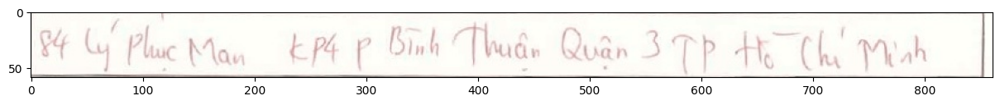

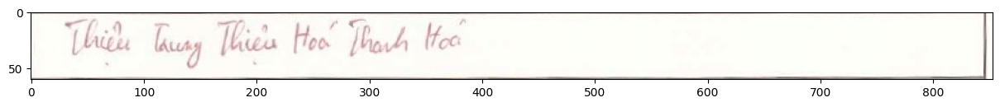

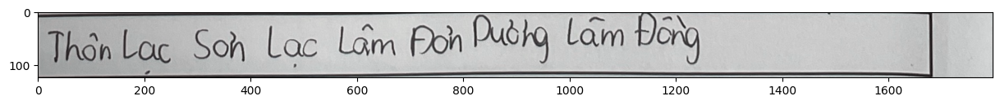

In [27]:
for i in range(3):
    plt.figure(figsize=(15,2))
    val_img_path = val_image_paths[i]
    img = cv2.imread(val_img_path)
    plt.imshow(img)
    plt.show()

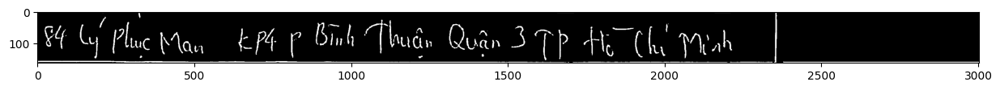

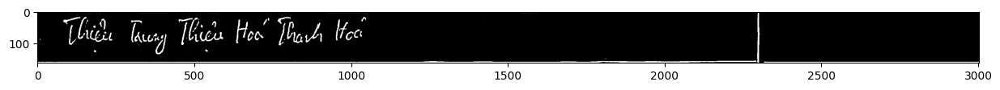

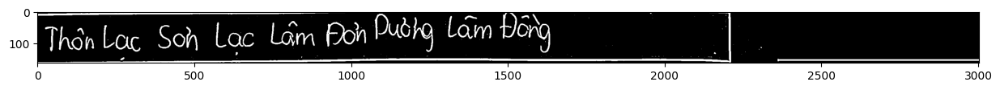

In [28]:
for i in range(3):
    plt.figure(figsize=(15,2))
    plt.imshow(valid_img[i][:,:,0], cmap="gray")
    plt.show()

In [29]:

# this is the most controversial part when our max_label_len should be set different or slightly smaller than TIME_STEPS
# but let stick to the conventional/normal way: we should to be the same with our TIME_STEPS
max_label_len = TIME_STEPS

max_label_len = 68 # try different max_label_len

In [30]:

# import padding library
from tensorflow.keras.preprocessing.sequence import pad_sequences

# pad each output label to maximum text length, remember we did that so that we keep training with rnn consistent?
train_padded_txt = pad_sequences(training_txt, maxlen=max_label_len, padding='post', value = 0)
valid_padded_txt = pad_sequences(valid_txt, maxlen=max_label_len, padding='post', value = 0)

In [31]:
train_padded_txt[0]

array([ 12,  49,   0,  27,  44, 129,   0,  31,  44, 114,   0,  35,  70,
         0,  22,  45,  49,  44,   0,  24,  78,  49,   0,  19,  93,  45,
         0,  15,  90,  88,  49,  43,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0], dtype=int32)

# Model Building

In [32]:
# OUR FULL MODEL OF CRNN AND LSTM

dropout = True
dropout_rate=0.2

# input with shape of height=32 and width=128
inputs = Input(shape=(163,3002,1))

# Block 1
x = Conv2D(64, (3,3), padding='same')(inputs)
x = MaxPool2D(pool_size=3, strides=3)(x)
x = Activation('relu')(x)
x_1 = x
print("x1",x)

if dropout:
    x = Dropout(dropout_rate)(x)  # Add dropout layer here

# Block 2
x = Conv2D(64, (3,3), padding='same')(x)
x = MaxPool2D(pool_size=3, strides=3)(x)
x = Activation('relu')(x)
x_2 = x
print("x2",x)


if dropout:
    x = Dropout(dropout_rate)(x)  # Add dropout layer here

# Block 3
x = Conv2D(128, (3,3), padding='same')(x)

x = BatchNormalization()(x)
x = Activation('relu')(x)
x_3 = x
print("x3",x)


if dropout:
    x = Dropout(dropout_rate)(x)  # Add dropout layer here

# Block4
x = Conv2D(128, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Add()([x,x_3])
x = Activation('relu')(x)
x_4 = x
print("x4",x)


if dropout:
    x = Dropout(dropout_rate)(x)  # Add dropout layer here

# Block5
x = Conv2D(256, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x_5 = x
print("x5",x)


if dropout:
    x = Dropout(dropout_rate)(x)  # Add dropout layer here

# Block6
x = Conv2D(256, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Add()([x,x_5])
x = Activation('relu')(x)
x = MaxPool2D(pool_size=(3, 1))(x)
print("x6",x)


if dropout:
    x = Dropout(dropout_rate)(x)  # Add dropout layer here

# Block7
x = Conv2D(512, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = MaxPool2D(pool_size=(3, 1))(x)
x = Activation('relu')(x)
print("x7",x)


if dropout:
    x = Dropout(dropout_rate)(x)  # Add dropout layer here

# pooling layer with kernel size (2,2) to make the height/2 #(1,9,512)
x = MaxPool2D(pool_size=(2, 1))(x)

print("x8",x)
# # to remove the first dimension of one: (1, 31, 512) to (31, 512)
squeezed = Lambda(lambda x: K.squeeze(x, 1))(x)

# # # bidirectional LSTM layers with units=128
blstm_1 = Bidirectional(LSTM(512, return_sequences=True, dropout = 0.2))(squeezed)
blstm_2 = Bidirectional(LSTM(512, return_sequences=True, dropout = 0.2))(blstm_1)

# # this is our softmax character proprobility with timesteps
outputs = Dense(len(char_list)+1, activation = 'softmax')(blstm_2)

# model to be used at test time

act_model = Model(inputs, outputs)

act_model.summary()

x1 KerasTensor(type_spec=TensorSpec(shape=(None, 54, 1000, 64), dtype=tf.float32, name=None), name='activation_7/Relu:0', description="created by layer 'activation_7'")
x2 KerasTensor(type_spec=TensorSpec(shape=(None, 18, 333, 64), dtype=tf.float32, name=None), name='activation_8/Relu:0', description="created by layer 'activation_8'")
x3 KerasTensor(type_spec=TensorSpec(shape=(None, 18, 333, 128), dtype=tf.float32, name=None), name='activation_9/Relu:0', description="created by layer 'activation_9'")
x4 KerasTensor(type_spec=TensorSpec(shape=(None, 18, 333, 128), dtype=tf.float32, name=None), name='activation_10/Relu:0', description="created by layer 'activation_10'")
x5 KerasTensor(type_spec=TensorSpec(shape=(None, 18, 333, 256), dtype=tf.float32, name=None), name='activation_11/Relu:0', description="created by layer 'activation_11'")
x6 KerasTensor(type_spec=TensorSpec(shape=(None, 6, 333, 256), dtype=tf.float32, name=None), name='max_pooling2d_7/MaxPool:0', description="created by l

In [33]:
### ctc definition part
"""
The reason why we use ctc_batch_cost instead of ctc_cost because
In batch cost, the program managed to mask out padded sequence using label_length,
So the cost won't include the padding 0 section.
"""

"""
The way CTC is modelled currently in Keras is that you need to implement the loss function as a layer, you did that already (loss_out).
Your problem is that the inputs you give that layer are not tensors from Theano/TensorFlow but numpy arrays.
To change that one option is to model these values as inputs to your model.
That is why we need to manually create Input for labels, input length and label_length.
"""

# define the label input shape for ctc
labels = Input(name='the_labels', shape=[max_label_len], dtype='float32')

"""
where input_length and label_length are constants you created previously
the easiest way here is to have a fixed batch size in training
the lengths should have the same batch size (see shapes in the link for ctc_cost)
"""

# define the length of input and label for ctc
input_length = Input(name='input_length', shape=[1], dtype='int64')
label_length = Input(name='label_length', shape=[1], dtype='int64')

# define a ctc lambda function to take arguments and return ctc_bach_cost
def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    """
    labels: tensor (number of samples, max_string_length) containing the truth labels.
    y_pred: tensor (number of samples, time_steps, num_character_labels) containing the prediction, or output of the softmax.
    input_length: tensor (number of samples, 1) containing the sequence length for each batch item in y_pred.
    label_length: tensor (number of samples, 1) containing the sequence length for each batch item in y_true.
    """
    print ("ctc_lambda_func", y_pred, labels, input_length, label_length)
    return K.ctc_batch_cost(labels, y_pred, input_length, label_length)

# out loss function (just take the inputs and put it in our ctc_batch_cost)
loss_out = Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([outputs, labels, input_length, label_length])

#model to be used at training time
model = Model(inputs=[inputs, labels, input_length, label_length], outputs=loss_out)

ctc_lambda_func Tensor("Placeholder:0", shape=(None, 333, 142), dtype=float32) Tensor("Placeholder_1:0", shape=(None, 68), dtype=float32) Tensor("Placeholder_2:0", shape=(None, 1), dtype=int64) Tensor("Placeholder_3:0", shape=(None, 1), dtype=int64)


In [34]:
outputs, labels, input_length, label_length

(<KerasTensor: shape=(None, 333, 142) dtype=float32 (created by layer 'dense')>,
 <KerasTensor: shape=(None, 68) dtype=float32 (created by layer 'the_labels')>,
 <KerasTensor: shape=(None, 1) dtype=int64 (created by layer 'input_length')>,
 <KerasTensor: shape=(None, 1) dtype=int64 (created by layer 'label_length')>)

In [35]:
# ready ctc loss function and optimizers
model.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer = 'adam')

# our callbacks hell to optimize our learning
callbacks = [
    TensorBoard(
        log_dir='./logs',
        histogram_freq=10,
        profile_batch=0,
        write_graph=True,
        write_images=False,
        update_freq="epoch"),
    ModelCheckpoint(
        filepath=os.path.join('checkpoint_weights.hdf5'),
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=True,
        verbose=1),
    EarlyStopping(
        monitor='val_loss',
        min_delta=1e-8,
        patience=20,
        restore_best_weights=True,
        verbose=1),
    ReduceLROnPlateau(
        monitor='val_loss',
        min_delta=1e-8,
        factor=0.2,
        patience=10,
        verbose=1)
]
callbacks_list = callbacks

In [36]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 163, 3002, 1)]       0         []                            
                                                                                                  
 conv2d_7 (Conv2D)           (None, 163, 3002, 64)        640       ['input_2[0][0]']             
                                                                                                  
 max_pooling2d_5 (MaxPoolin  (None, 54, 1000, 64)         0         ['conv2d_7[0][0]']            
 g2D)                                                                                             
                                                                                                  
 activation_7 (Activation)   (None, 54, 1000, 64)         0         ['max_pooling2d_5[0][0]'

In [37]:
# notice I convert everything to numpy array here since model can fit either tensors and numpy array
# the reason why i stick with numpy array because it is simple to code and also because it is baseline solution
# I want to use openCV (can't run with tensors because it is CPU operations)
# And if I want to use tensors then i will make sure my image preprocessing functions uses tensor compatible operations

# ready our training data
training_img = np.array(training_img)
train_input_length = np.array(train_input_length)  # all must be equal length to T timesteps
train_label_length = np.array(train_label_length)  # different length (only the same in Captcha dataset)

# ready our validating data
valid_img = np.array(valid_img)
valid_input_length = np.array(valid_input_length) # all must be equal length to T timesteps
valid_label_length = np.array(valid_label_length) # different length (only the same in Captcha dataset)


In [38]:
train_input_length, train_label_length

(array([333, 333, 333, ..., 333, 333, 333]),
 array([32,  8, 39, ..., 44, 39, 36]))

In [39]:
# choose batchsize and epochs

batch_size = 32
epochs = 100
#device_name = None
#history = model.fit(x=[training_img, train_padded_txt, train_input_length, train_label_length],
#          y=np.zeros(len(training_img)),
#          batch_size=batch_size,
#          epochs = epochs,
#          validation_data = ([valid_img, valid_padded_txt, valid_input_length, valid_label_length], [np.zeros(len(valid_img))]),
#          verbose = 1, callbacks = callbacks_list)


Epoch 1/100
ctc_lambda_func Tensor("model_1/dense/Softmax:0", shape=(None, 333, 142), dtype=float32) Tensor("model_1/Cast:0", shape=(None, 68), dtype=float32) Tensor("model_1/ExpandDims:0", shape=(None, 1), dtype=int64) Tensor("model_1/ExpandDims_1:0", shape=(None, 1), dtype=int64)
ctc_lambda_func Tensor("model_1/dense/Softmax:0", shape=(None, 333, 142), dtype=float32) Tensor("model_1/Cast:0", shape=(None, 68), dtype=float32) Tensor("model_1/ExpandDims:0", shape=(None, 1), dtype=int64) Tensor("model_1/ExpandDims_1:0", shape=(None, 1), dtype=int64)


2023-10-19 19:36:39.291521: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


68/68 [==============================] - ETA: 0s - loss: 189.8169ctc_lambda_func Tensor("model_1/dense/Softmax:0", shape=(None, 333, 142), dtype=float32) Tensor("model_1/Cast:0", shape=(None, 68), dtype=float32) Tensor("model_1/ExpandDims:0", shape=(None, 1), dtype=int64) Tensor("model_1/ExpandDims_1:0", shape=(None, 1), dtype=int64)

Epoch 1: val_loss improved from inf to 134.25902, saving model to checkpoint_weights.hdf5
68/68 [==============================] - 124s 2s/step - loss: 189.8169 - val_loss: 134.2590 - lr: 0.0010
Epoch 2/100
68/68 [==============================] - ETA: 0s - loss: 132.9996
Epoch 2: val_loss did not improve from 134.25902
68/68 [==============================] - 82s 1s/step - loss: 132.9996 - val_loss: 136.6416 - lr: 0.0010
Epoch 3/100
68/68 [==============================] - ETA: 0s - loss: 131.0916
Epoch 3: val_loss did not improve from 134.25902
68/68 [==============================] - 95s 1s/step - loss: 131.0916 - val_loss: 144.6025 - lr: 0.0010
Epoch 

# Evaluation




In [40]:

# load the saved best model weights
act_model.load_weights(os.path.join('checkpoint_weights.hdf5.20231019.05'))

In [41]:
# predict outputs on validation images
NO_PREDICTS = 100
OFFSET=0
# prediction = act_model.predict(valid_img[OFFSET:OFFSET+NO_PREDICTS])
prediction = act_model.predict(valid_img)

17/17 [==============================] - 10s 309ms/step


In [42]:
# NO_PREDICTS image results
# 9 timesteps
# 32 chars + 1 blank
prediction.shape

(540, 333, 142)

In [43]:
# use CTC decoder
out = K.get_value(K.ctc_decode(prediction, input_length=np.ones(prediction.shape[0])*prediction.shape[1],
                         greedy=True)[0][0])
# see the results
all_predictions =[]
i = 0
for x in out:
    print("original_text  = ", valid_orig_txt[i+OFFSET])
    print("predicted text = ", end = '')
    pred = ""
    for p in x:
        if int(p) != -1:
            pred += char_list[int(p)]
    print(pred)
    all_predictions.append(pred)
    i+=1

original_text  =  84 Lý Phục Man Kp4 P Bình Thuận Quận 3 Tp Hồ Chí Minh
predicted text = 84 Lý Phục Man Kp4 P Bình Thuận Quận 3 Tp Hồ Chí Minh
original_text  =  Thiệu Trung Thiệu Hoá Thanh Hoá
predicted text = Thiệu Trung Thiệu Ho Thanh Hoá
original_text  =  Thôn Lạc Sơn Lạc Lâm Đơn Dương Lâm Đồng
predicted text = Thôn Lạc Sơn Lạc Lâm Đơn Dương Lâm Đồng
original_text  =  Đại Đồng Vĩnh Tường Vĩnh Phúc
predicted text = Đại Đồng Vĩnh Tường Vĩnh Phúc
original_text  =  Tổ 3 Thị Trấn Đông Anh Đông Anh Hà Nội
predicted text = Tổ 3 Thị Tấn Đôn Anh Dưng Anh Hà Nội
original_text  =  Thôn Bến Đông Bắc Sơn Ân Thi Hưng Yên
predicted text = Thôn Bến Đông Bắc Sơn An Thi Hưng Yên
original_text  =  35/59 Trần Quang Khải Phường 6 Tp Sóc Trăng Sóc Trăng
predicted text = 35/59 Trần Quang Khải Phường 6 Tp Sóc Trăng Sóc Trăng
original_text  =  Tt Cty Xây Lấp Nội Thượng Vĩnh Tuy Hai Bà Trưng Hà Nội
predicted text = Tt CtY Xuyg Lấp Ni Thng Vĩnh Tu Hả Đn H Ni
original_text  =  45 Nguyễn Hữu Dật Hoà Cường Bắc H

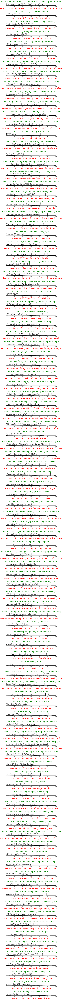

In [44]:
#YOUR PART: WRITE TO PRINT OUT THE IMAGES IN NICE 2D ARRAY PLOT WITH ORIGINAL TEXT AND PREDICTED TEXT
plt.figure(figsize=(10,200))
col=0
row=1
gs1 = gridspec.GridSpec(NO_PREDICTS, 1)
# gs1.update(wspace=0.025, hspace=0.025)
for n in range(NO_PREDICTS):
    plt.subplot(gs1[n])
    plt.imshow(valid_img[n][:,:,0], cmap="gray_r")
    plt.title(f"Label {n}: "+valid_orig_txt[n+OFFSET], fontsize=20, color="green")
    plt.xlabel(f"Prediction {n}: "+all_predictions[n+OFFSET], fontsize=20, color="red")


In [45]:
def ocr_metrics(predicts, ground_truth, norm_accentuation=False, norm_punctuation=False):
    """Calculate Character Error Rate (CER), Word Error Rate (WER) and Sequence Error Rate (SER)"""

    if len(predicts) == 0 or len(ground_truth) == 0:
        return (1, 1, 1)

    cer, wer, ser = [], [], []

    for (pd, gt) in zip(predicts, ground_truth):

        if norm_accentuation:
            pd = unicodedata.normalize("NFKD", pd).encode("ASCII", "ignore").decode("ASCII")
            gt = unicodedata.normalize("NFKD", gt).encode("ASCII", "ignore").decode("ASCII")

        if norm_punctuation:
            pd = pd.translate(str.maketrans("", "", string.punctuation))
            gt = gt.translate(str.maketrans("", "", string.punctuation))

        pd_cer, gt_cer = list(pd.lower()), list(gt.lower())
        dist = editdistance.eval(pd_cer, gt_cer)
        cer.append(dist / (max(len(pd_cer), len(gt_cer))))

        pd_wer, gt_wer = pd.lower().split(), gt.lower().split()
        dist = editdistance.eval(pd_wer, gt_wer)
        wer.append(dist / (max(len(pd_wer), len(gt_wer))))

        pd_ser, gt_ser = [pd], [gt]
        dist = editdistance.eval(pd_ser, gt_ser)
        ser.append(dist / (max(len(pd_ser), len(gt_ser))))

    cer_f = sum(cer) / len(cer)
    wer_f = sum(wer) / len(wer)
    ser_f = sum(ser) / len(ser)

    return (cer_f, wer_f, ser_f)

In [46]:
evaluate = ocr_metrics(predicts=all_predictions,
                                  ground_truth=valid_orig_txt,
                                  norm_accentuation=False,
                                  norm_punctuation=False)

e_corpus = "\n".join([
    "Metrics:",
    "Character Error Rate: {}".format(evaluate[0]),
    "Word Error Rate:      {}".format(evaluate[1]),
    "Sequence Error Rate:  {}".format(evaluate[2]),
])

In [47]:
print(e_corpus)

Metrics:
Character Error Rate: 0.032645167142575926
Word Error Rate:      0.10504858824303276
Sequence Error Rate:  0.5037037037037037


In [48]:
publictest_img = []

i=0

for public_img_path in test_files:
    print(public_img_path)
    # read input image and convert into gray scale image
    img = cv2.imread(public_img_path)
    print(img.shape)
    img = preprocessimage(img)

    # add channel dimension
    img = np.expand_dims(img , axis = 2)

    # Normalize each image
    img = img/255.

    publictest_img.append(img)

    i = i + 1

    if (i%500 == 0):
        print ("has processed test {} files".format(i))

OCR/public_test/images/168/8.jpg
(122, 1834, 3)
OCR/public_test/images/168/9.jpg
(121, 1833, 3)
OCR/public_test/images/168/14.jpg
(125, 1824, 3)
OCR/public_test/images/168/15.jpg
(128, 1822, 3)
OCR/public_test/images/168/17.jpg
(130, 1821, 3)
OCR/public_test/images/168/16.jpg
(130, 1822, 3)
OCR/public_test/images/168/12.jpg
(123, 1828, 3)
OCR/public_test/images/168/13.jpg
(125, 2369, 3)
(163, 3089)
(163, 3002)
OCR/public_test/images/168/11.jpg
(123, 1830, 3)
OCR/public_test/images/168/10.jpg
(123, 1832, 3)
OCR/public_test/images/168/21.jpg
(136, 1819, 3)
OCR/public_test/images/168/20.jpg
(135, 1820, 3)
OCR/public_test/images/168/22.jpg
(137, 1818, 3)
OCR/public_test/images/168/23.jpg
(141, 1817, 3)
OCR/public_test/images/168/26.jpg
(147, 1815, 3)
OCR/public_test/images/168/18.jpg
(133, 1820, 3)
OCR/public_test/images/168/24.jpg
(144, 1815, 3)
OCR/public_test/images/168/25.jpg
(146, 1814, 3)
OCR/public_test/images/168/19.jpg
(133, 1820, 3)
OCR/public_test/images/168/4.jpg
(117, 1838, 3)

In [49]:
# predict outputs on validation images
NO_PREDICTS = 100
OFFSET=0
# prediction = act_model.predict(valid_img[OFFSET:OFFSET+NO_PREDICTS])
publictest_img = np.array(publictest_img)
prediction = act_model.predict(publictest_img)

17/17 [==============================] - 4s 242ms/step


In [50]:
prediction.shape

(540, 333, 142)

In [51]:
# use CTC decoder
out = K.get_value(K.ctc_decode(prediction, input_length=np.ones(prediction.shape[0])*prediction.shape[1],
                         greedy=True)[0][0])
# see the results
all_predictions =[]
i = 0
for x in out:
    print("predicted text = ", end = '')
    pred = ""
    for p in x:
        if int(p) != -1:
            pred += char_list[int(p)]
    print(pred)
    all_predictions.append(pred)
    i+=1

predicted text = 2/8 Lê Văn Hiến Phượng 1 Thành Phố Tân An Long An
predicted text = Thôn Tân Hoà Tân Lê Hưng Hà Thái Bình
predicted text = Tổ 1 Ấp Vĩnh Phát Vĩnh Lộc An Phú An Giang
predicted text = Sơn Đồông Linh Lợp Thaạch Vĩnh Phúc
predicted text = Tổ 6 Khu Thố 5 Thị Trạn Vĩnh An Vĩnh Cửu Đồng Nai
predicted text = Sơn Đồông Linh Lợp Thạch Vĩnh Phúc
predicted text = Nghĩa Khánh Nghĩa Đôn Nghệ An
predicted text = Tà Thái Hà Trng Thanh Hoá
predicted text = Thôn 6 Ho Bằng Thạch Thất Hà Nội
predicted text = Thanh Hai Hoàn Hoa Thám Tp Chí Linh Hải Dương
predicted text = Thôn Bến Đà Bạch Xa Hoàm Yên Tuyên Quang
predicted text = Tổ 1 Ấp 4 Bàu Can Long Thành Đồng Nai
predicted text = Thuỷ Đương Hương Thung Thừa Thiên Huế
predicted text = Thôn Cảo Vân Nham Hưn Luỳg Lang Sơn
predicted text = 963/95/24 Hông Bàng Phường 32 Quận 6 Tp Hồ Chí Minh
predicted text = 9882 Lương Thọ Vinh Tân Thối Hoà Tân Phú Hồ Chí Minh
predicted text = Xóm 7 Hai Lợt Hải Hậu Nam Định
predicted text = Hải Đông Hai Hậu N

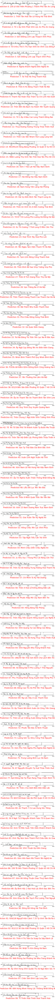

In [52]:
#YOUR PART: WRITE TO PRINT OUT THE IMAGES IN NICE 2D ARRAY PLOT WITH ORIGINAL TEXT AND PREDICTED TEXT
plt.figure(figsize=(10,200))
col=0
row=1
gs1 = gridspec.GridSpec(NO_PREDICTS, 1)
# gs1.update(wspace=0.025, hspace=0.025)
for n in range(NO_PREDICTS):
    plt.subplot(gs1[n])
    plt.imshow(publictest_img[n][:,:,0], cmap="gray_r")
    plt.xlabel(f"Prediction {n}: "+all_predictions[n+OFFSET], fontsize=20, color="red")


In [53]:
ids = [test_file.replace('OCR/public_test/images/', '') for test_file in test_files]
sumitssion = pd.DataFrame({'id': ids, 'answer': all_predictions}, columns=['id', 'answer'])

sumitssion.head()
sumitssion.to_csv("submitssion.csv",  index=False)


In [54]:
## command: tensorboard --logdir=logs/ --host localhost --port 8888

In [56]:
!kill 75160